In [37]:
import pandas as pd 
import numpy as np
import matplotlib.pyplot as plt 
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score


In [38]:
df= pd.read_csv("train.csv")
df.head()

,label,pixel0,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,...,pixel774,pixel775,pixel776,pixel777,pixel778,pixel779,pixel780,pixel781,pixel782,pixel783
0,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,4,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [39]:
df.sample()

,label,pixel0,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,...,pixel774,pixel775,pixel776,pixel777,pixel778,pixel779,pixel780,pixel781,pixel782,pixel783
40934,4,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


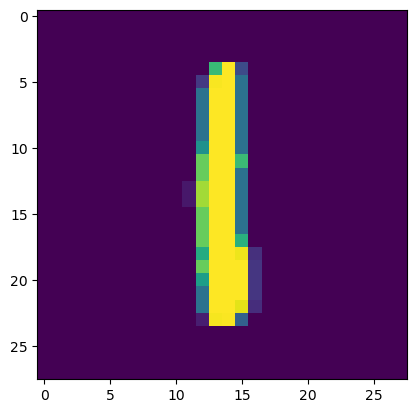

In [40]:
plt.imshow(df.iloc[29367,1:].values.reshape(28,28))

In [41]:
x=df.iloc[:,1:]
y=df.iloc[:,0]
x_train, x_test, y_train, y_test= train_test_split(x,y, test_size=0.2, random_state=42)

In [42]:
from sklearn.neighbors import KNeighborsClassifier
knn=KNeighborsClassifier()
knn.fit(x_train, y_train)

KNeighborsClassifier()

In [44]:
y_pred= knn.predict(x_test)

In [45]:
import time
start =time.perf_counter()
y_pred= knn.predict(x_test)
print(time.perf_counter()- start)

9.556182400032412


In [46]:
accuracy_score(y_test, y_pred)

0.9648809523809524

In [47]:
#central shift of data
from sklearn.preprocessing import StandardScaler
scaler= StandardScaler()
x_train=scaler.fit_transform(x_train)
x_test=scaler.transform(x_test)

In [48]:
from sklearn.decomposition import PCA
pca=PCA(n_components=100)
x_train_trf=pca.fit_transform(x_train)
x_test_trf=pca.transform(x_test)
knn.fit(x_train_trf,y_train)

KNeighborsClassifier()

In [49]:
y_pred=knn.predict(x_test_trf)
accuracy_score(y_test, y_pred)

0.9534523809523809

In [50]:
for i in range(1,785):
    pca=PCA(n_components=i)
    x_train_trs=pca.fit_transform(x_train)
    x_test_trs=pca.transform(x_test)
    knn=KNeighborsClassifier()
    knn.fit(x_train_trs,y_train)
    y_Pred=knn.predict(x_test_trs)
    print(accuracy_score(y_test, y_Pred))

0.2567857142857143
0.3242857142857143
0.5101190476190476
0.6661904761904762
0.7378571428571429
0.8227380952380953
0.8432142857142857
0.8723809523809524
0.886547619047619
0.9051190476190476
0.9117857142857143
0.9179761904761905
0.9278571428571428
0.934404761904762
0.9383333333333334
0.9379761904761905
0.9411904761904762
0.9404761904761905
0.9422619047619047
0.9439285714285715
0.9429761904761905
0.9441666666666667
0.9451190476190476
0.9446428571428571
0.9484523809523809
0.9488095238095238
0.9472619047619047
0.9479761904761905


KeyboardInterrupt: 

In [52]:
#2d-plotting
pca=PCA(n_components=2)
x_train_trs=pca.fit_transform(x_train)
x_test_trs=pca.transform(x_test)


In [53]:
x_train_trs

array([[-2.71863857, -0.48971063],
       [-0.67687671, -6.75370384],
       [-3.03323763,  6.50988877],
       ...,
       [ 2.14888189,  0.78088557],
       [ 1.05950195,  0.94767442],
       [17.70252087,  1.96168067]])

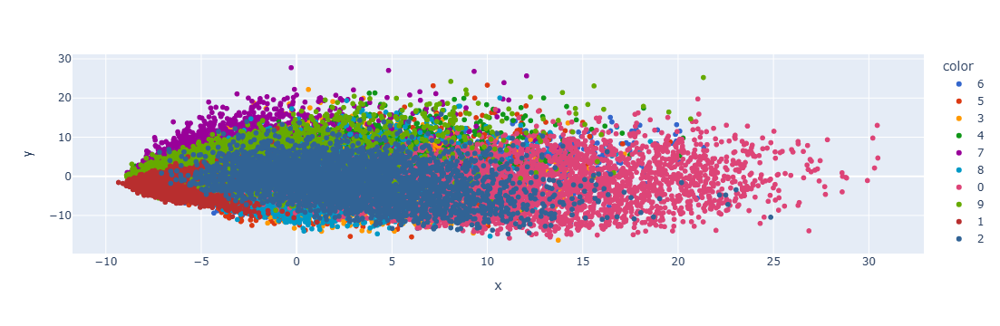

In [56]:
import plotly.express as px
y_train_trf=y_train.astype(str)
fig= px.scatter(
    x=x_train_trf[:,0],
    y=x_train_trf[:,1],
    color=y_train_trf,
    color_discrete_sequence= px.colors.qualitative.G10
)
fig.show()


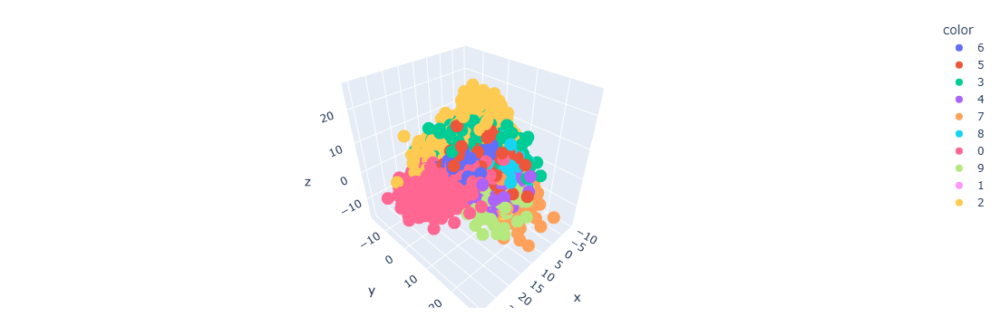

In [60]:
#3d Plotting
x_test_trs=pca.transform(x_test)
y_train_trf=y_train.astype(str)
fig= px.scatter_3d(df, x=x_train_trf[:,0], y=x_train_trf[:,1], z=x_train_trf[:,2],
    color=y_train_trf)
fig.update_layout(
    margin=dict(l=20, r=20, t=20, b=20)
)
fig.show()